In [1]:
%matplotlib widget

In [2]:
%pwd

'/home/ggosti/Code/merkhet-analytics-tool'

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import math

from scipy import stats
from scipy.spatial.distance import euclidean
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import homogeneity_score
from sklearn.cluster import AgglomerativeClustering

import json
import merkhetAnalyticsTool as ma
from math import ceil

# Position

In [4]:
basePath = "path/to/group/folder/" 
pathSes  = basePath + "preprocessed-VR-sessions-gated/" 

ids, fileNames, dfSs, df = ma.readData(pathSes)
ids, fileNames, [paths,dpaths,fpaths] = ma.getVarsFromSession(pathSes,['pos','dir','f'])
#print(fpaths[0].shape, paths[1].shape)
bbox = ma.makeBBox(paths,dpaths,fpaths)
print(bbox)

# for panoramic scene data we only look at directions
paths = [ma.getPath(dfSs[uId],['dirx','diry','dirz']) for uId in ids]

{'x0': -2.224, 'x1': 1.8649999999999998, 'y0': -1.754, 'y1': 2.66, 'z0': -2.03, 'z1': 1.76}


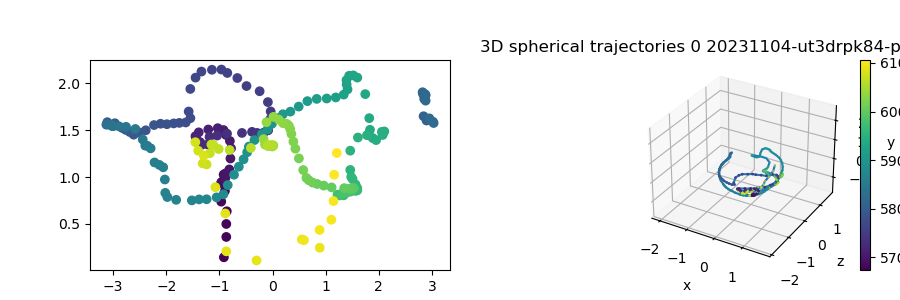

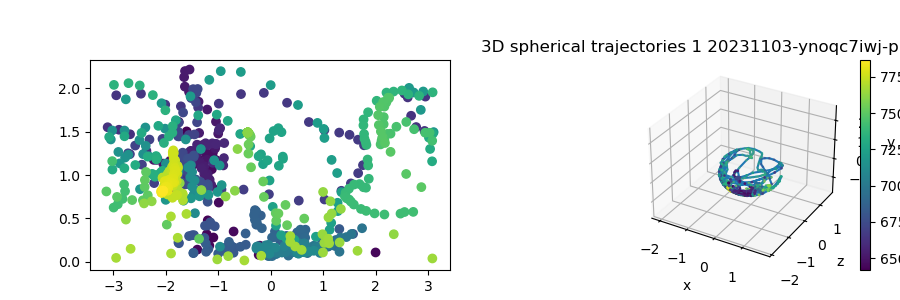

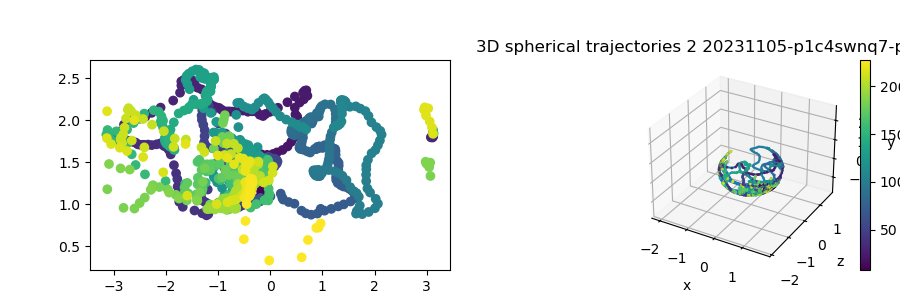

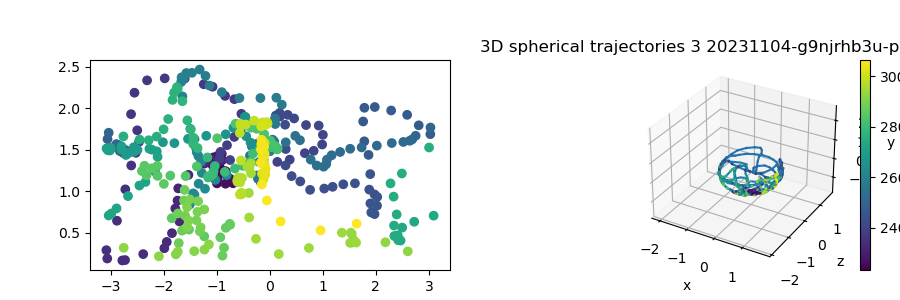

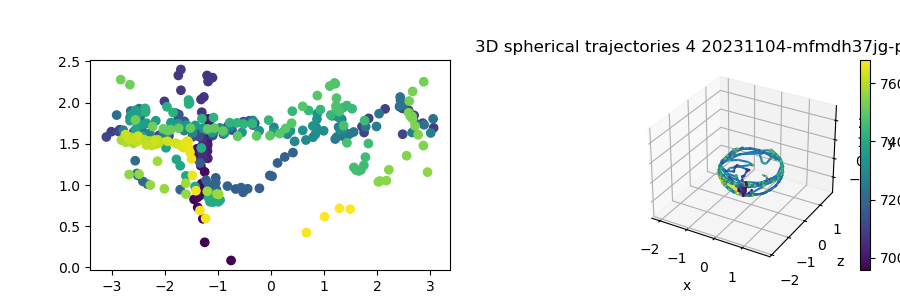

...

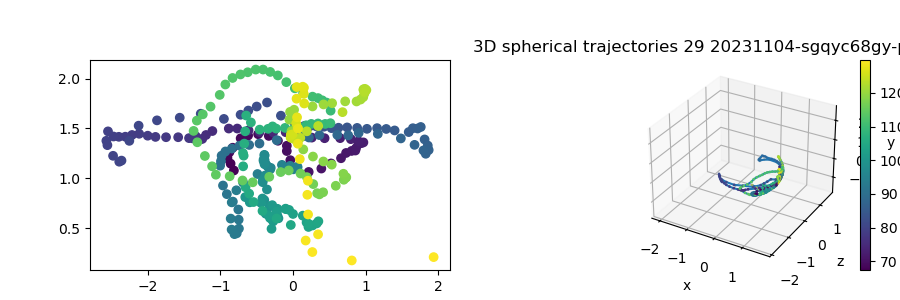

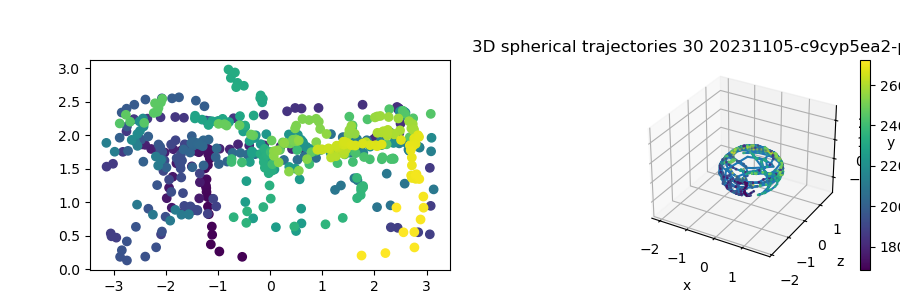

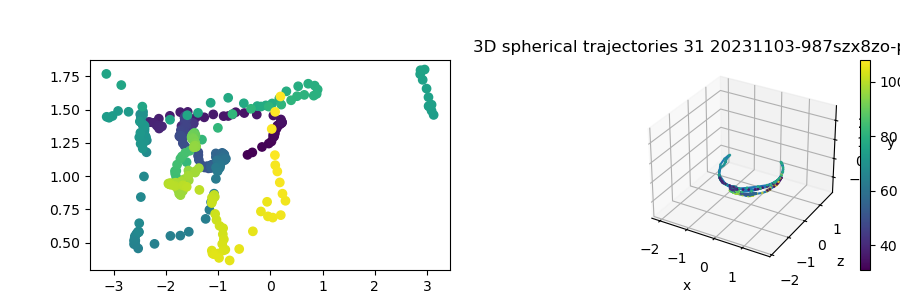

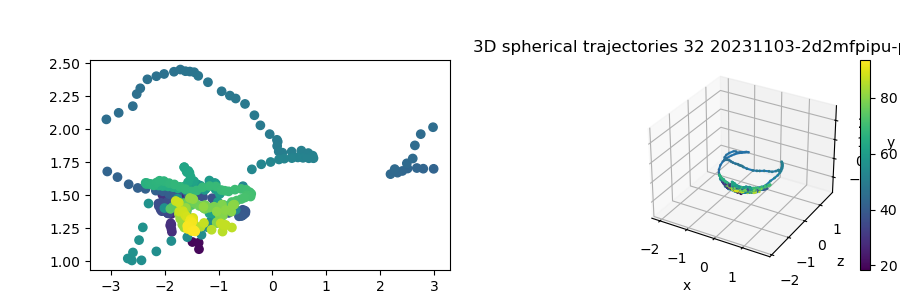

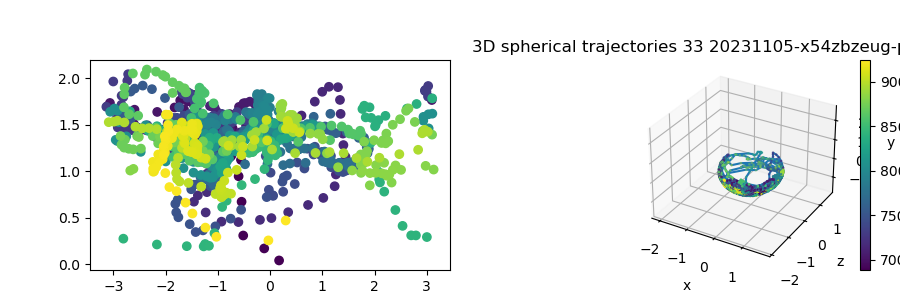

In [25]:
for uId in ids:
    path = paths[uId] #ts[uId],xs[uId],ys[uId],zs[uId]
    #dpath = dpaths[uId]
    fig = plt.figure(figsize=(9,3))
    ax = fig.add_subplot([0.7, 0.1, 0.3, 0.7] , projection='3d') 
    ax,sc = ma.drawPath(path, dpath=None, ax=ax, BBox=bbox, colorbar=True)
    ax.set_title('3D spherical trajectories '+str(uId)+' '+fileNames[uId])
    #plt.stop()
    ax1 = fig.add_subplot([0.1, 0.1, 0.4, 0.7]) 
    t,x,y,z = path.T
    theta,phi = ma.cartesian_to_spherical(x,z,y)
    ax1.scatter(phi,theta,c=t)
    

file name 0 20231104-ut3drpk84-preprocessed
file name 1 20231103-ynoqc7iwj-preprocessed
file name 2 20231105-p1c4swnq7-preprocessed
file name 3 20231104-g9njrhb3u-preprocessed
file name 4 20231104-mfmdh37jg-preprocessed
file name 5 20231104-vqai59f33-preprocessed
file name 6 20231104-3qfo6ip7c-preprocessed
file name 7 20231103-1g0d5m3yd-preprocessed
file name 8 20231104-kpo73vsrx-preprocessed
file name 9 20231103-7pz1x6jtk-preprocessed
file name 10 20231104-xmehn9gh6-preprocessed
file name 11 20231104-99g5ar8a4-preprocessed
file name 12 20231104-umhu2rj21-preprocessed
file name 13 20231104-833xkufu9-preprocessed
file name 14 20231104-67zqi4gdp-preprocessed
file name 15 20231105-y9ahnebum-preprocessed
file name 16 20231103-mbw168zve-preprocessed
file name 17 20231105-y2v1g8jxx-preprocessed
file name 18 20231105-h4cdrcmyk-preprocessed
file name 19 20231103-eqae8pkvh-preprocessed
file name 20 20231104-f2xj9wrrm-preprocessed
file name 21 20231104-zskxitbp4-preprocessed
file name 22 2023110

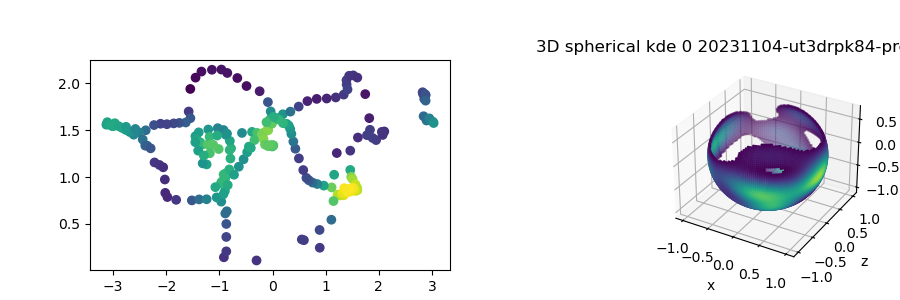

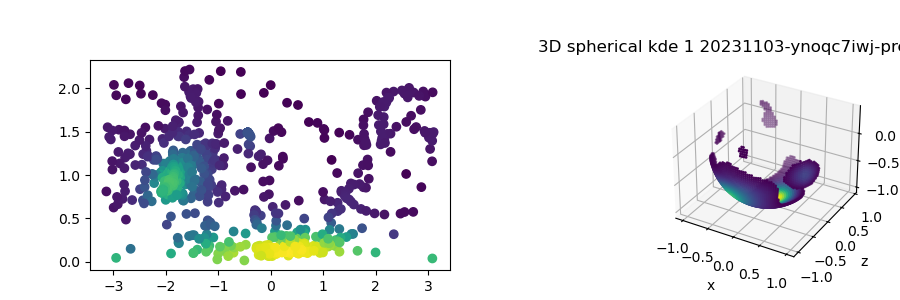

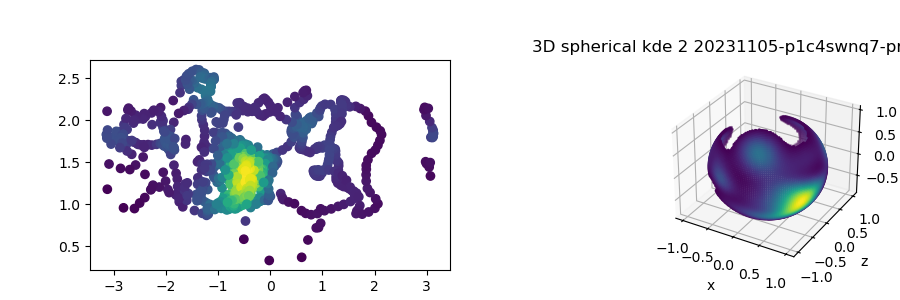

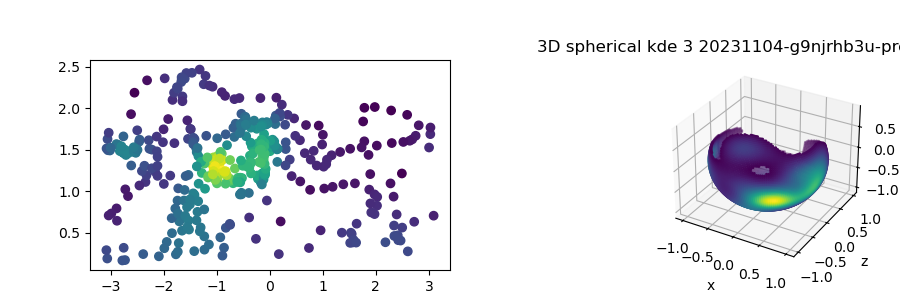

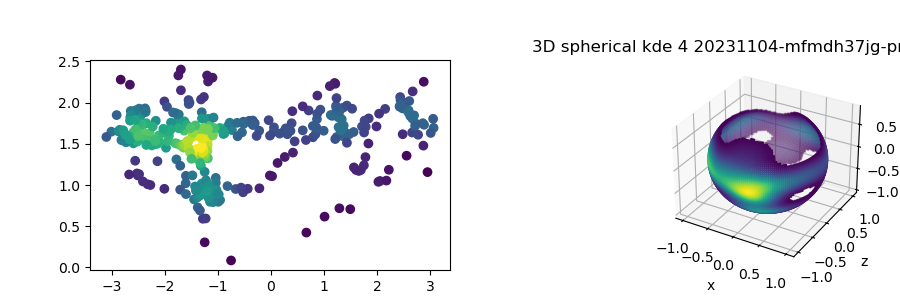

...

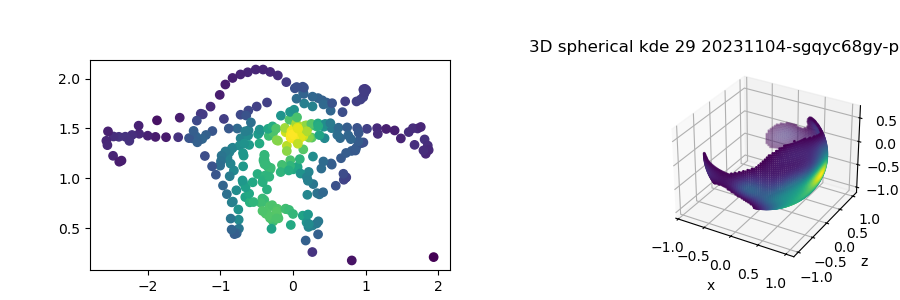

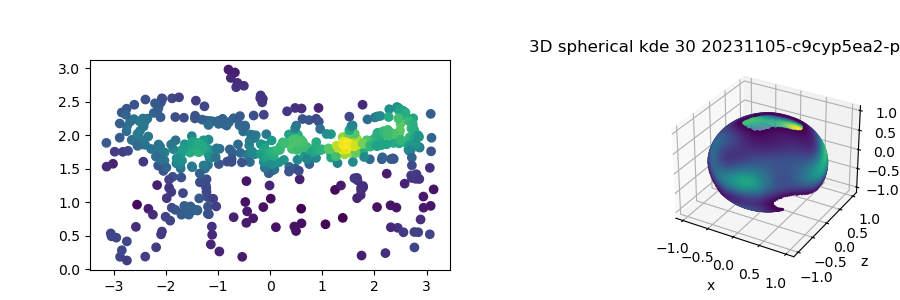

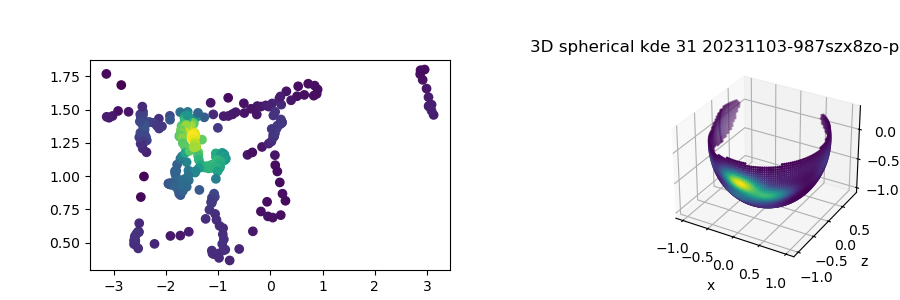

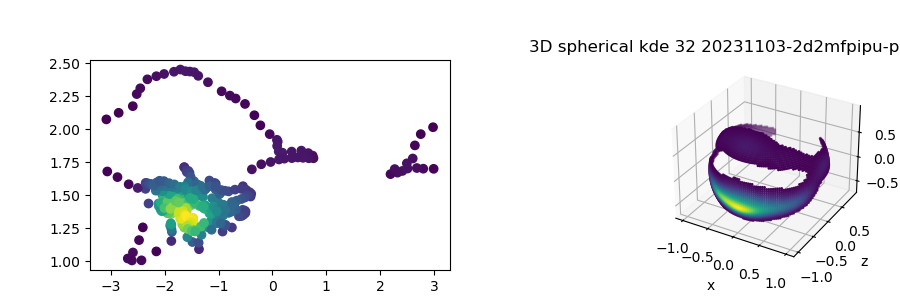

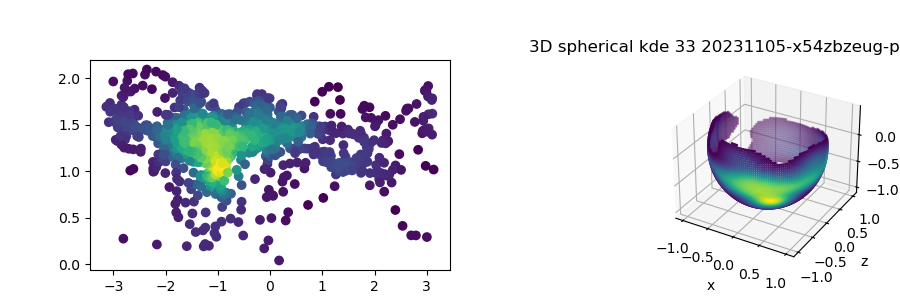

In [36]:
sph_densitys = []
kdes = []

for uId in ids:
    path = paths[uId] #ts[uId],xs[uId],ys[uId],zs[uId]
    print('file name',uId,fileNames[uId])
    t,xConc,yConc,zConc = path.T
    xyz = np.vstack([xConc,yConc,zConc])
    kde = stats.gaussian_kde(xyz)
    xc, yc, zc, thetac, phic, sph_density = ma.panoramic_spherical_kde(kde,binSize=2)
    sph_densitys.append(sph_density)
    kdes.append(kde)
    
    fig = plt.figure(figsize=(9,3))
    ax = fig.add_subplot([0.7, 0.1, 0.3, 0.7] , projection='3d',) 
    th = 0.00001
    sc = ax.scatter(xc[sph_density>th], zc[sph_density>th], yc[sph_density>th], c=sph_density[sph_density>th],s=1)
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title('3D spherical kde '+str(uId)+' '+fileNames[uId])

    ax1 = fig.add_subplot([0.1, 0.1, 0.4, 0.7]) 
    t,x,y,z = path.T
    xyz2 = np.vstack([x,y,z])
    theta,phi = ma.cartesian_to_spherical(x,z,y)
    #ax1.plot(phi,theta)
    ax1.scatter(phi,theta,c=kde(xyz2))

In [30]:
len(sph_densitys)

34

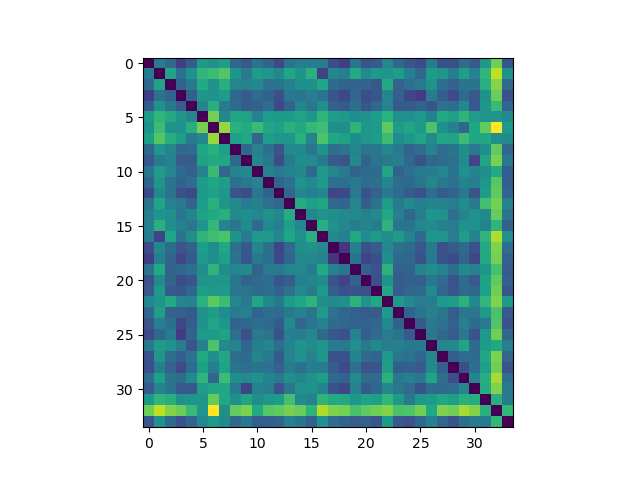

In [31]:
from scipy.spatial import distance
eucMat = distance.cdist(sph_densitys, sph_densitys, metric='euclidean')
plt.figure()
plt.imshow(eucMat)

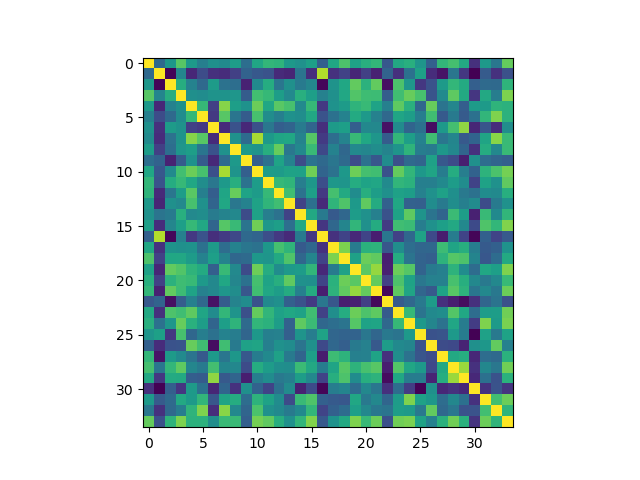

In [32]:
corr_matrix = np.corrcoef(sph_densitys)
plt.figure()
plt.imshow(corr_matrix)

In [33]:
np.min(np.exp(-corr_matrix))

0.3678794411714424

In [68]:
mask = np.ones(corr_matrix.shape, dtype=bool)
np.fill_diagonal(mask, 0)
max_value = corr_matrix[mask].max()
print('max',max_value)
print('argmax',np.where(corr_matrix==max_value))
bestMatch = np.where(corr_matrix==max_value)[0]
min_value = corr_matrix[mask].min()
print('min',min_value)
print('argmin',np.where(corr_matrix==min_value))
poorestMatch = np.where(corr_matrix==min_value)[0]

max 0.8669421438188831
argmax (array([ 1, 16]), array([16,  1]))
min -0.15701844304844761
argmin (array([ 1, 30]), array([30,  1]))


[25, 1, 16, 22, 9, 8, 12, 14, 15, 33, 24, 31, 4, 7, 10, 26, 5, 32, 30, 6, 28, 29, 27, 17, 18, 13, 20, 23, 2, 19, 21, 11, 0, 3]
[ 0  2  3  6 11 13 17 18 19 20 21 23 27 28 29]
[30]
[ 4  5  7  8  9 10 12 14 15 22 24 26 31 32 33]
[ 1 16 25]


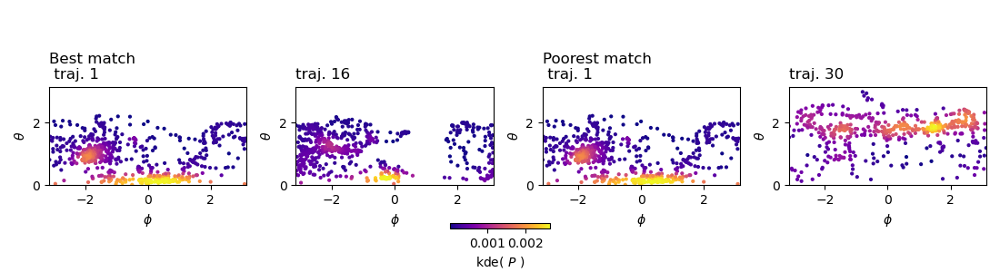

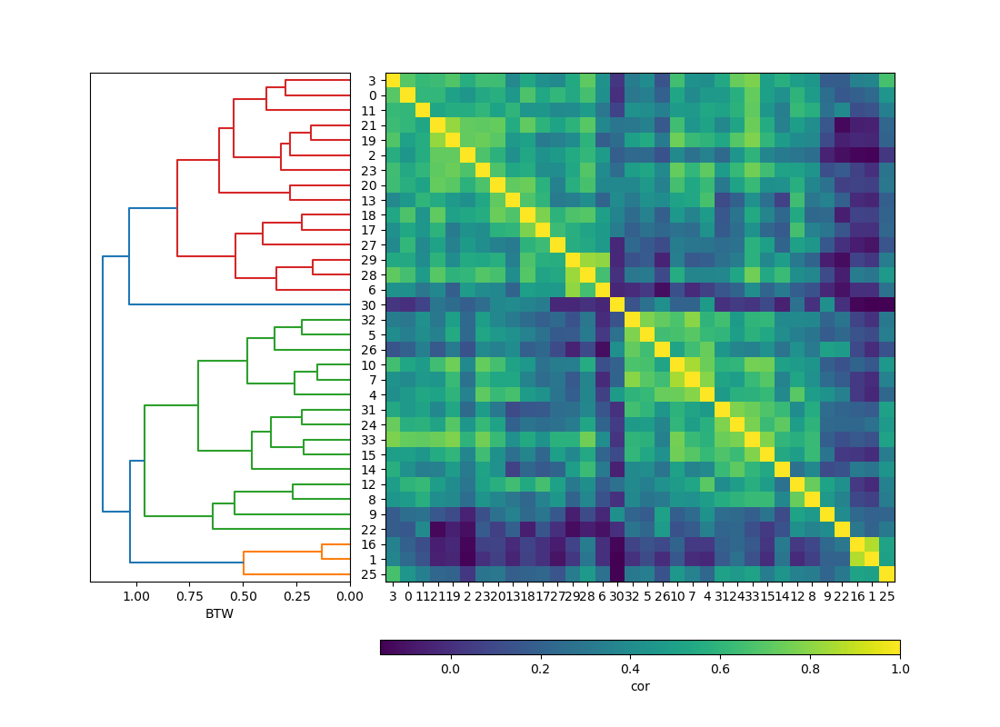

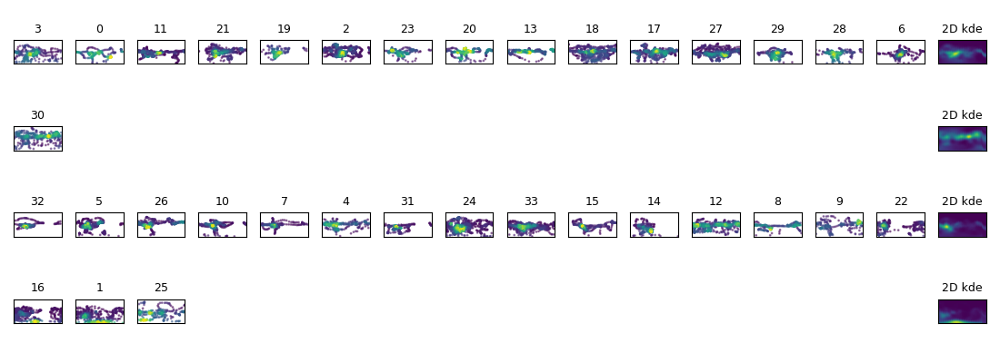

In [121]:
n_clusters = 4
model = AgglomerativeClustering(compute_full_tree=True, compute_distances=True,n_clusters=n_clusters, metric='precomputed', linkage='complete')
#cluster = model.fit_predict(np.exp(-corr_matrix))
cluster = model.fit_predict(1-corr_matrix)

f,axs= plt.subplots(1,4,figsize=(11,3))

t,x,y,z = paths[bestMatch[0]].T
kde = kdes[bestMatch[0]]
xyz2 = np.vstack([x,y,z])
theta,phi = ma.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
Z = 1 /((2*np.pi/180)**2)
im2=axs[0].scatter(phi,theta,c=kde(xyz2)/Z ,s=4,zorder=1,cmap='plasma',label='traj.'+str(bestMatch[0]))
#axs[0].plot(phi,theta)

t,x,y,z = paths[bestMatch[1]].T
kde = kdes[bestMatch[1]]
xyz2 = np.vstack([x,y,z])
theta,phi = ma.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
axs[1].scatter(phi,theta,c=kde(xyz2)/Z,s=4,zorder=1,cmap='plasma',label='traj.'+str(bestMatch[1]))
#axs[0].set_ylim((5.5,-5.5))
#axs[0].set_xlim((bbox['x1'],bbox['x0']))
#axs[0].axes.get_xaxis().set_ticks([])
#axs[0].axes.get_yaxis().set_ticks([])
axs[0].set_xlabel(r'$\phi$')
axs[0].set_ylabel(r'$\theta$')
axs[0].set_xlim((-np.pi,np.pi))
axs[0].set_ylim((0,np.pi))
axs[0].set_aspect('equal', adjustable='box')

axs[1].set_xlabel(r'$\phi$')
axs[1].set_ylabel(r'$\theta$')
axs[1].set_xlim((-np.pi,np.pi))
axs[1].set_ylim((0,np.pi))
axs[1].set_aspect('equal', adjustable='box')

axs[0].set_title('Best match \n traj. '+str(bestMatch[0]), loc='left')
axs[1].set_title('traj. '+str(bestMatch[1]), loc='left')
#axs[0].legend(loc=1)


t,x,y,z = paths[poorestMatch[0]].T
kde = kdes[poorestMatch[0]]
xyz2 = np.vstack([x,y,z])
theta,phi = ma.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
axs[2].scatter(phi,theta,c=kde(xyz2)/Z,s=4,zorder=1,cmap='plasma',label='traj.'+str(poorestMatch[0]))

t,x,y,z = paths[poorestMatch[1]].T
kde = kdes[poorestMatch[1]]
xyz2 = np.vstack([x,y,z])
theta,phi = ma.cartesian_to_spherical(x,z,y)
#axs[0].scatter(phi,theta,c=kde(xyz2),s=4,zorder=1,cmap='plasma')
axs[3].scatter(phi,theta,c=kde(xyz2)/Z,s=4,zorder=1,cmap='plasma',label='traj.'+str(poorestMatch[1]))
#axs[0].set_ylim((5.5,-5.5))
#axs[0].set_xlim((bbox['x1'],bbox['x0']))
#axs[0].axes.get_xaxis().set_ticks([])
#axs[0].axes.get_yaxis().set_ticks([])
axs[2].set_xlabel(r'$\phi$')
axs[2].set_ylabel(r'$\theta$')
axs[2].set_xlim((-np.pi,np.pi))
axs[2].set_ylim((0,np.pi))
axs[2].set_aspect('equal', adjustable='box')

axs[3].set_xlabel(r'$\phi$')
axs[3].set_ylabel(r'$\theta$')
axs[3].set_xlim((-np.pi,np.pi))
axs[3].set_ylim((0,np.pi))
axs[3].set_aspect('equal', adjustable='box')

#axs[2].set_title('Poorest match '+str(poorestMatch[0])+','+str(poorestMatch[1]), loc='left')
axs[2].set_title('Poorest match \n traj. '+str(poorestMatch[0]), loc='left')
axs[3].set_title('traj. '+str(poorestMatch[1]), loc='left')
plt.tight_layout()

axcolor2 = f.add_axes([0.45, 0.16, 0.1, 0.02])
plt.colorbar(im2, cax=axcolor2, orientation = 'horizontal')
plt.xlabel('kde( $P$ )')



fig = plt.figure(figsize=(11, 8))
ax0 = fig.add_axes([0.09, 0.2, 0.26, 0.7])
ax1 = fig.add_axes([0.34, 0.2, 0.6, 0.7])
axcolor = fig.add_axes([0.38, 0.1, 0.52, 0.02])
dg = ma.plot_dendrogram(model, n_clusters, orientation='left', ax=ax0)
ax0.set_yticks([])
ax0.set_xlabel('BTW')

leaves = dg['leaves']
print(leaves)
#ma.plotSorted(corr_matrix,leaves)
#fig = plt.figure()
#ax = fig.add_subplot()
#ax.imshow(HsFlat[leaves,:].T,cmap='seismic')
#_=ax.set_xticks(leaves)
im = ax.imshow(corr_matrix)
ma.plotSorted(corr_matrix,leaves[::-1],ax=ax1)
#ax1.set_title('D)', loc='left')
#fig = plt.figure()
#ax = fig.add_subplot()
#ax.imshow(HsFlat[leaves,:].T,cmap='seismic')
#_=ax.set_xticks(leaves)

plt.colorbar(im, cax=axcolor, orientation = 'horizontal')
axcolor.set_xlabel('cor')

nclusters = np.max(cluster)
#print(nclusters)
unique, counts = np.unique(cluster, return_counts=True)
#print(nclusters,unique, counts)
maxClSize = np.max(counts)
clOld = -1
fig = plt.figure(figsize=(11,4))
#plt.text(-0.02, 1.02, 'E)', fontsize=12)
plt.axis('off')

orderClusters = []
i = -1
j = 1

for uId in reversed(leaves):
    #print(uId)
    path = paths[uId] #ts[uId],xs[uId],ys[uId],zs[uId]
    #density = densities[uId]
    cl = cluster[uId]
    kde = kdes[uId]
    if cl != clOld:
        orderClusters.append(cl)
        i=i+1
        j = 1
        #dpath = dpaths[uId]
        #ma.drawPath(path, dpath=None, BBox=bbox)
        #plt.stop()
        #print(uId,cl)
        clOld = cl
        #maxClSize = counts[unique == cl][0]
        #print('maxClSize',maxClSize)
        #fig = plt.figure()
    #print(maxClSize,int(maxClSize/6)+1,int(maxClSize%6)+1,i)
    #ax = fig.add_subplot(ceil(maxClSize/12), min([maxClSize,12]),i, projection='3d') 
    #print(uId,i,j)
    ax = fig.add_subplot(nclusters+1, maxClSize+1,j+i*(maxClSize+1)) 
    j = j +1
    th = 0.1
    #ma.drawPath(path, dpath=None, BBox=bbox,ax=ax)
    #ma.drawPath2DT(path, dpath=None, BBox=bbox,ax=ax, yup=True,pointSize=4)
    t,x,y,z = path.T
    #kde = kdes[bestMatch[1]]
    xyz2 = np.vstack([x,y,z])
    theta,phi = ma.cartesian_to_spherical(x,z,y)
    ax.scatter(phi,theta,c=kde(xyz2),s=1,alpha=0.5,label='traj.'+str(bestMatch[1]))
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    #ax.set_xlabel(r'$\phi$')
    #ax.set_ylabel(r'$\theta$')
    ax.set_xlim((-np.pi,np.pi))
    ax.set_ylim((0,np.pi))
    ax.set_aspect('equal', adjustable='box')
    ax.set_title(str(uId), fontsize=9)
    #ax.axes.get_zaxis().set_ticks([])

for i,j in enumerate(orderClusters):
    clTrajs = np.where(cluster==j)[0]
    print(clTrajs)
    pathsConc =  np.vstack([paths[k] for k in clTrajs])
    tConv,xConc,yConc,zConc = pathsConc.T#np.concatenate(xs),np.concatenate(ys),np.concatenate(zs)

    xyz = np.vstack([xConc,yConc,zConc])
    kde = stats.gaussian_kde(xyz)
    xc, yc, zc, thetac, phic, sph_density = ma.panoramic_spherical_kde(kde,binSize=2)

    f = np.reshape(sph_density.T, xc.shape)

    #fig = plt.figure()
    #ax = fig.gca()
    ax = fig.add_subplot(nclusters+1, maxClSize+1,(i+1)*(maxClSize+1)) 
    
    cfset = ax.scatter(phic, thetac, c=f)
    ax.set_title('2D kde', fontsize=9)
    ax.set_xlim((-np.pi,np.pi))
    ax.set_ylim((0,np.pi))
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    ax.set_aspect('equal', adjustable='box')

    clusterFileNames =  [fileNames[k] for k in clTrajs]
    pathOut = basePath
    kdefname = '/panoramic-dir-3d-kde-cluster'+str(i)+'.json'
    ma.write_panoramic_kde_tojson(sph_density, xc, yc, zc, bbox, binSize=2, recordsFolderName=pathSes, records=clusterFileNames, filename=pathOut+kdefname)

plt.tight_layout()